In [20]:
import pandas as pd

In [21]:
mvp1_path = "web-Dash//mvp1data.csv"

In [22]:
df = pd.read_csv(mvp1_path)
df

,_unit_id,_golden,_unit_state,_trusted_judgments,confidence,confidence:stddev,relation,relation:confidence,orig__golden,context,...,sentence_1,sentence_2,speaker_1,speaker_2,topic,relation_AAF,relation_BAF,gpt_davinci,gpt_35,gpt_35_0613
0,3085729585,True,golden,65,4.45,0.702,neither,0.8807,True,"<strong>Kamala Harris:</strong> ""Please vote.""...",...,And I have every confidence that the same Amer...,And I think that movement of Americans has onl...,Mike Pence,Mike Pence,Election,0,0,2,2,2
1,3085729586,True,golden,70,4.46,0.750,neither,0.9203,True,"<strong>Donald Trump:</strong> ""Look what happ...",...,This is ridiculous.,Absolutely ridiculous.,Joe Biden,Joe Biden,Racism,0,0,2,2,2
2,3085729587,True,golden,60,3.93,0.772,neither,1.0000,True,"<strong>Donald Trump:</strong> ""And you’ll get...",...,But let me just tell you-,In [crosstalk 00:16:04]?,Donald Trump,Joe Biden,Economy,0,0,0,0,0
3,3085729588,False,golden,6,4.33,0.471,attack,0.4744,True,"<strong>Kristen Welker:</strong> ""I have one f...",...,"By the way, I have a transition from the old i...","Oh, that’s a big statement.",Joe Biden,Donald Trump,Climate change,1,1,0,0,0
4,3085729589,True,golden,67,4.57,0.628,support,0.9631,True,"<strong>Susan Page:</strong> ""So, tell us spec...",...,I couldn’t be more proud to serve as vice pres...,I’m pro-life.,Mike Pence,Mike Pence,Supreme Court,0,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4099,3102289860,True,golden,27,4.15,0.705,neither,0.9597,NaN,"<strong>Donald Trump:</strong> ""No, no.""\n<br>...",...,And the word is-,And that’s what’s happening.,Donald Trump,Donald Trump,Racism,0,0,0,0,0
4100,3102290142,True,golden,28,4.04,0.823,neither,1.0000,NaN,"<strong>Joe Biden:</strong> ""By the way, my so...",...,Can you get back 30 seconds?,"You in the home, you got less you’re in more t...",Joe Biden,Joe Biden,Why They Should Be Elected,0,0,0,0,0
4101,3102290221,True,golden,26,4.00,0.679,neither,0.9202,NaN,"<strong>Donald Trump:</strong> ""And why aren’t...",...,And they’ve got you wrapped around their finge...,"Yes, there is.",Donald Trump,Joe Biden,Racism,0,0,0,0,0
4102,3102290404,True,golden,25,4.04,0.774,neither,0.9209,NaN,"<strong>Chris Wallace:</strong> ""This month, y...",...,"And you know it, and so does everybody else.",And he would know it- [crosstalk 00:33:02],Donald Trump,Donald Trump,Racism,0,0,0,0,0


In [23]:
sen1 = df["sentence_1"]
sen2 = df["sentence_2"]
relation = df["relation_AAF"]

In [60]:
# Combind two lists of sentences
arguments = [x for n in (sen1,sen2) for x in n]
# Create attacks list based on relation
attacks = [(arguments.index(sen1[i]), arguments.index(sen2[i])) for i in range(len(sen1)) if relation[i] == 1]

# Output
print("input")
print(f"a = {sen1}")
print(f"b = {sen2}")
print(f"relation = {relation}\n")

print("output")
print(f"arguments = {arguments} #@param {{allow-input: true}}")
print(f"attacks = {attacks}")


input
a = 0       And I have every confidence that the same Amer...
1                                     This is ridiculous.
2                               But let me just tell you-
3       By the way, I have a transition from the old i...
4       I couldn’t be more proud to serve as vice pres...
                              ...                        
4099                                     And the word is-
4100                         Can you get back 30 seconds?
4101    And they’ve got you wrapped around their finge...
4102         And you know it, and so does everybody else.
4103                                   And what happened?
Name: sentence_1, Length: 4104, dtype: object
b = 0       And I think that movement of Americans has onl...
1                                  Absolutely ridiculous.
2                                In [crosstalk 00:16:04]?
3                             Oh, that’s a big statement.
4                                           I’m pro-life.
            

In [4]:
df["topic"]

0                         Election
1                           Racism
2                          Economy
3                   Climate change
4                    Supreme Court
                   ...            
4099                        Racism
4100    Why They Should Be Elected
4101                        Racism
4102                        Racism
4103                        Racism
Name: topic, Length: 4104, dtype: object

In [5]:
df.value_counts("sentence_1")

sentence_1
Thank you.                                                                                                               26
Okay.                                                                                                                    17
Yeah.                                                                                                                    15
Not true.                                                                                                                15
Come on.                                                                                                                 14
                                                                                                                         ..
No serious person has said the opposite.                                                                                  1
No president should ever have to go through what I went through.                                                         

In [6]:
df.value_counts("sentence_2")

sentence_2
Thank you.                                                                            36
Okay.                                                                                 31
Excuse me.                                                                            17
Yeah.                                                                                 15
Not true.                                                                             13
                                                                                      ..
If I were running it, I’d know what the plan is.                                       1
If I run it badly, they’ll probably blame him, but they’ll blame me.                   1
I would’ve never run.                                                                  1
I would say almost everything I see is from the left wing not from the right wing.     1
Let me also say the American people deserve to know-                                   1
Length: 26

In [7]:
df['topic'].unique()

array(['Election', 'Racism', 'Economy', 'Climate change', 'Supreme Court',
       'Minimum wage', 'COVID', 'Healthcare', 'National Security',
       'Vice-presidency', 'Families', 'Taxes', 'Integrity', 'Democracy',
       'Leadership', 'Why They Should Be Elected', 'LGBTQ',
       'Foreign policy', nan], dtype=object)

In [8]:
unique_topics = df['topic'].unique()

output_data = {}

# Loop through unique topics and filter the DataFrame for each topic
for topic in unique_topics:
    filtered_df = df[df['topic'] == topic]
    output_data[f"data_{topic}"] = filtered_df.to_dict(orient='list')


In [9]:
print(output_data)

{'data_Election': {'_unit_id': [3085729585, 3085729604, 3085730159, 3085730189, 3085730197, 3085730230, 3085730262, 3085730303, 3085730312, 3085730319, 3085730350, 3085730433, 3085730434, 3085730464, 3085730478, 3085730485, 3085730496, 3085730513, 3085730515, 3085730545, 3085730549, 3085730570, 3085730593, 3085730607, 3085730629, 3085730639, 3085730674, 3085730682, 3085730717, 3085730723, 3085730811, 3085730862, 3085730883, 3085730916, 3085730918, 3085730940, 3085731002, 3085731050, 3085731069, 3085731073, 3085731090, 3085731093, 3090747085, 3090747206, 3090747297, 3090747395, 3090747462, 3090747517, 3090747520, 3090747523, 3090747531, 3090747532, 3090747548, 3090800296, 3090800309, 3090800379, 3090800404, 3090800467, 3090800487, 3090800549, 3090800572, 3090800622, 3090800625, 3090800649, 3090800738, 3095157281, 3095157299, 3095157352, 3095157379, 3095157439, 3095157442, 3095157457, 3095157461, 3095157465, 3095157499, 3095157558, 3095157583, 3095157601, 3095157663, 3095157673, 30951576

In [10]:
for i in output_data['data_Election']:
    print(i)

_unit_id
_golden
_unit_state
_trusted_judgments
confidence
confidence:stddev
relation
relation:confidence
orig__golden
context
pair_id
relation_gold
relation_gold_reason
sentence_1
sentence_2
speaker_1
speaker_2
topic
relation_AAF
relation_BAF
gpt_davinci
gpt_35
gpt_35_0613


In [11]:
for i in output_data['data_Election']:
    print(i)

_unit_id
_golden
_unit_state
_trusted_judgments
confidence
confidence:stddev
relation
relation:confidence
orig__golden
context
pair_id
relation_gold
relation_gold_reason
sentence_1
sentence_2
speaker_1
speaker_2
topic
relation_AAF
relation_BAF
gpt_davinci
gpt_35
gpt_35_0613


In [12]:
print(output_data['data_Election']['sentence_1'])
print(output_data['data_Election']['sentence_2'])
print(output_data['data_Election']['relation_BAF'])

['And I have every confidence that the same Americans that delivered that historic victory in 2016, they see this president’s record where we rebuild our military.', 'And I believe they are doing that because they know that Joe Biden has a deep, deep seated commitment to fight for our democracy, and to fight for the integrity of our democracy, and to bring integrity back to the White House.', 'This is an outstanding person, and I’m using my fourth term.', 'I have never seen anything like it.', 'Brecklin, it’s a wonderful question.', 'And if you look at it and if you put the shoe on the other foot, if they had this, they would do it 100%.', 'I look at the relationship between Justice Ruth Bader Ginsberg, the late justice who we just lost from the Supreme Court, and the late justice Antonin Scalia.', 'And of course, we’ve all seen the avalanche, what you put the country through for the better part of three years, until it was found that there was no obstruction, no collusion, case closed

In [13]:
pip install networkx


[notice] A new release of pip is available: 23.0 -> 23.2.1
[notice] To update, run: pip3.11 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [14]:
pip install mplcursors


[notice] A new release of pip is available: 23.0 -> 23.2.1
[notice] To update, run: pip3.11 install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [15]:
import networkx as nx
import matplotlib.pyplot as plt
import mplcursors

def convert_lists_to_integers(list_a, list_b):
    combined_list = list_a + list_b
    unique_elements = list(set(combined_list))
    element_to_integer = {element: str(index + 1) for index, element in enumerate(unique_elements)}

    converted_list_a = [element_to_integer[element] for element in list_a]
    converted_list_b = [element_to_integer[element] for element in list_b]

    node_descriptions = {value: key for key, value in element_to_integer.items()}

    return converted_list_a, converted_list_b, node_descriptions


def visualize_graph(list_a, list_b, list_relation, node_descriptions=None, figsize=(10, 6), k=0.1):
    non_atk_nodes = []
    attack_nodes = []
    support_node = []

    G_non_atk = nx.DiGraph()
    G_attack = nx.DiGraph()
    G_support = nx.DiGraph()
    count_atk = 0
    count_sup = 0
    count_non_atk = 0
    count_all = 0
    for i, (a, b, relation) in enumerate(zip(list_a, list_b, list_relation)):
        count_all+=1
        if relation == 1:
            attack_nodes.append(a)
            attack_nodes.append(b)
            G_attack.add_edge(a, b)
            count_atk+=1
        elif relation == 2:
            support_node.append(a)
            support_node.append(b)
            G_support.add_edge(a, b)
            count_non_atk +=1
        else:
            non_atk_nodes.append(a)
            non_atk_nodes.append(b)
            G_non_atk.add_edge(a, b)
            count_non_atk +=1
    print("Non Atk:", count_non_atk, "Atk:", count_atk, "Summ:",count_all)

    pos_non = nx.spring_layout(G_non_atk, k=k)
    pos_sup = nx.spring_layout(G_support, k=k)
    pos_attack = nx.spring_layout(G_attack, k=k)

    plt.figure(figsize=(8, 4))

    # Plot Non-attack(Neither, Support) relation graph
    plt.subplot(1, 2, 1)
    nx.draw_networkx(G_non_atk, pos_non, with_labels=True, node_color='lightblue', node_size=500)
    nx.draw_networkx(G_support, pos_sup, with_labels=True, node_color='green', node_size=800)
    plt.title("Non Attack Relation (Count: {}, Self-Loops: {})".format(len(G_non_atk.edges)+len(G_support.edges), len(list(nx.selfloop_edges(G_non_atk)))+len(list(nx.selfloop_edges(G_support)))))

    # Plot Attack relation graph
    plt.subplot(1, 2, 2)
    nx.draw_networkx(G_attack, pos_attack, with_labels=True, node_color='red', node_size=1000)
    plt.title("Attack Relation (Count: {}, Self-Loops: {})".format(len(G_attack.edges), len(list(nx.selfloop_edges(G_attack)))))

    # Show node descriptions on hover for the first subplot (Neither Relation)
    if node_descriptions is not None:
        cursor = mplcursors.cursor(hover=True)
        @cursor.connect("add")
        def on_hover(sel):
            node = sel.artist.get_text()
            if node in node_descriptions:
                description = node_descriptions[node]
                sel.annotation.set_text(description)
                sel.annotation.get_bbox_patch().set(fc="white")

    plt.tight_layout()
    plt.show()


In [16]:
elec_1 = output_data['data_Election']['sentence_1']
elec_2 = output_data['data_Election']['sentence_2']
elec_rel = output_data['data_Election']['relation_BAF']
elec_davin = output_data['data_Election']['gpt_davinci']
elec_35 = output_data['data_Election']['gpt_35']
elec_0613 = output_data['data_Election']['gpt_35_0613']

In [17]:
elec_1

['And I have every confidence that the same Americans that delivered that historic victory in 2016, they see this president’s record where we rebuild our military.',
 'And I believe they are doing that because they know that Joe Biden has a deep, deep seated commitment to fight for our democracy, and to fight for the integrity of our democracy, and to bring integrity back to the White House.',
 'This is an outstanding person, and I’m using my fourth term.',
 'I have never seen anything like it.',
 'Brecklin, it’s a wonderful question.',
 'And if you look at it and if you put the shoe on the other foot, if they had this, they would do it 100%.',
 'I look at the relationship between Justice Ruth Bader Ginsberg, the late justice who we just lost from the Supreme Court, and the late justice Antonin Scalia.',
 'And of course, we’ve all seen the avalanche, what you put the country through for the better part of three years, until it was found that there was no obstruction, no collusion, case

In [18]:
len(elec_rel)

131

Non Atk: 131 Atk: 0 Summ: 131


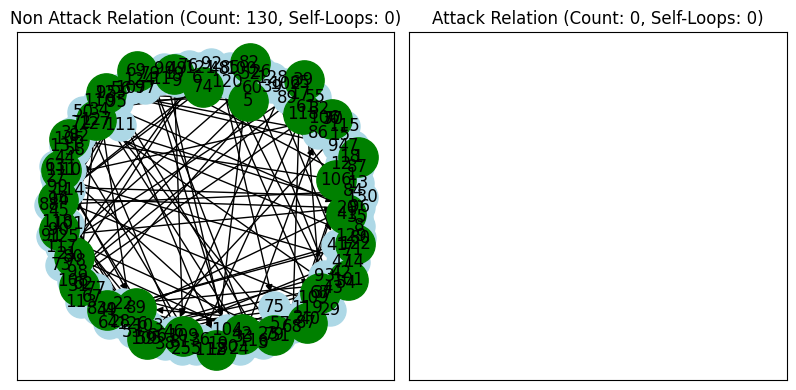

In [19]:

list_a, list_b, node_descriptions = convert_lists_to_integers(elec_1, elec_2)
visualize_graph(list_a, list_b, elec_rel, node_descriptions, figsize=(40, 20), k=5)

In [20]:
print(list_a)
print(list_b)

['79', '28', '111', '50', '130', '87', '1', '94', '39', '41', '80', '127', '15', '45', '110', '38', '39', '106', '62', '80', '110', '31', '18', '128', '109', '40', '70', '114', '19', '68', '39', '108', '123', '91', '85', '8', '42', '56', '49', '79', '2', '95', '5', '89', '29', '36', '50', '62', '116', '17', '124', '61', '53', '78', '87', '93', '37', '107', '69', '23', '62', '55', '50', '76', '114', '82', '36', '64', '73', '3', '10', '102', '90', '35', '42', '24', '43', '125', '14', '130', '103', '103', '68', '88', '13', '117', '22', '88', '5', '11', '5', '34', '54', '47', '77', '33', '51', '73', '66', '27', '98', '91', '96', '120', '18', '95', '26', '14', '61', '74', '80', '115', '27', '38', '25', '21', '43', '43', '26', '20', '12', '66', '66', '48', '91', '116', '102', '43', '126', '80', '5']
['104', '118', '89', '81', '70', '89', '101', '59', '67', '4', '42', '31', '123', '56', '126', '64', '41', '105', '112', '87', '20', '111', '82', '98', '92', '112', '1', '85', '109', '65', '79', 

Non Atk: 126 Atk: 5 Summ: 131


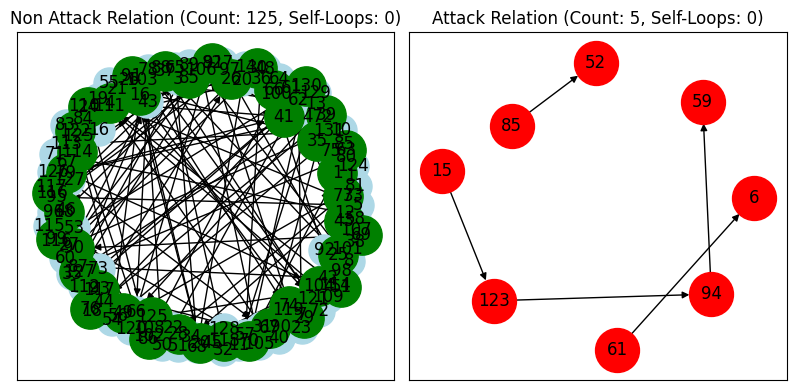

In [21]:
visualize_graph(list_a, list_b, elec_davin, node_descriptions, figsize=(30, 25), k=5)

Non Atk: 126 Atk: 5 Summ: 131


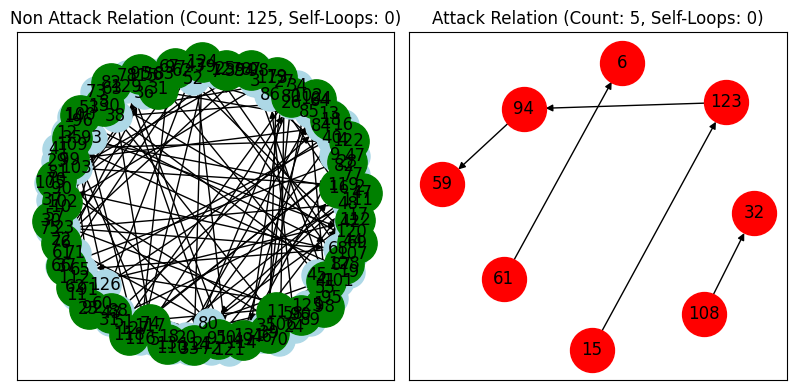

In [22]:
visualize_graph(list_a, list_b, elec_35, node_descriptions, figsize=(30, 25), k=5)

Non Atk: 123 Atk: 8 Summ: 131


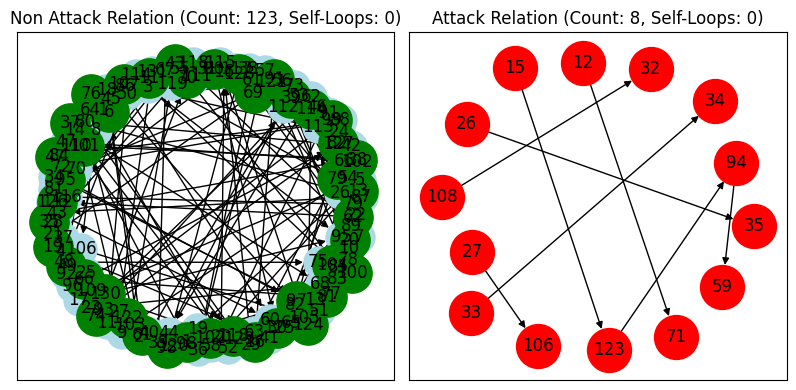

In [23]:
visualize_graph(list_a, list_b, elec_0613, node_descriptions, figsize=(30, 25), k=5)

In [24]:
lgbtq_1 = output_data['data_LGBTQ']['sentence_1']
lgbtq_2 = output_data['data_LGBTQ']['sentence_2']
lgbtq_rel = output_data['data_LGBTQ']['relation_BAF']
lgbtq_davin = output_data['data_LGBTQ']['gpt_davinci']
lgbtq_35 = output_data['data_LGBTQ']['gpt_35']
lgbtq_0613 = output_data['data_LGBTQ']['gpt_35_0613']

In [25]:
len(lgbtq_rel)

32

Non Atk: 32 Atk: 0 Summ: 32


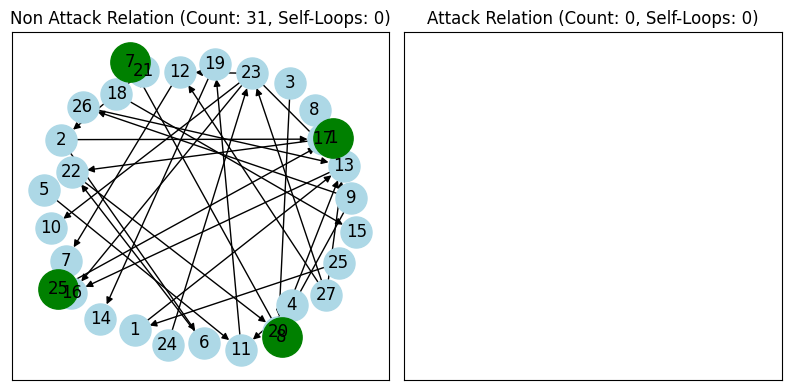

Non Atk: 32 Atk: 0 Summ: 32


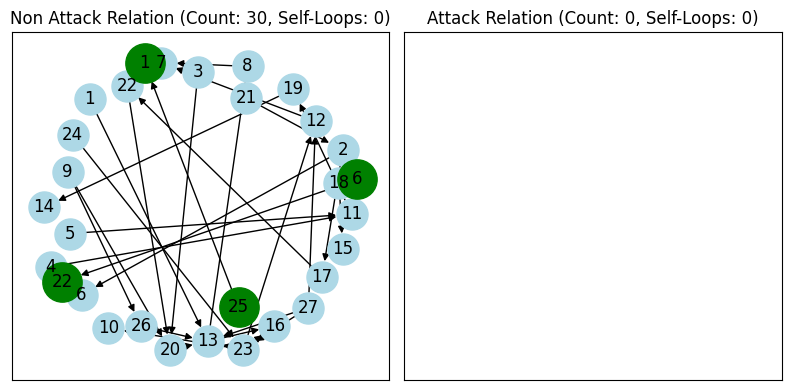

Non Atk: 32 Atk: 0 Summ: 32


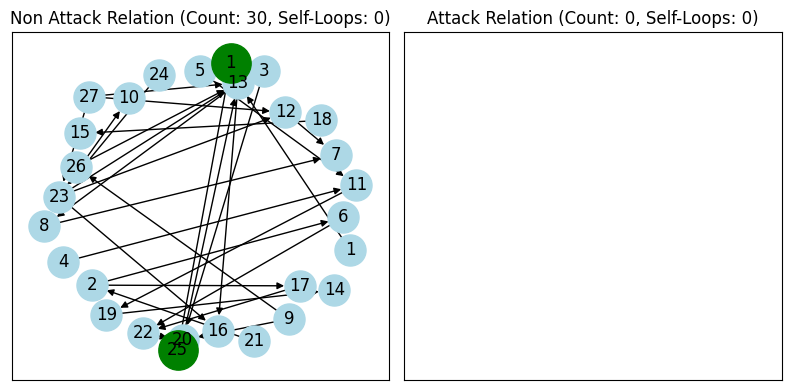

Non Atk: 32 Atk: 0 Summ: 32


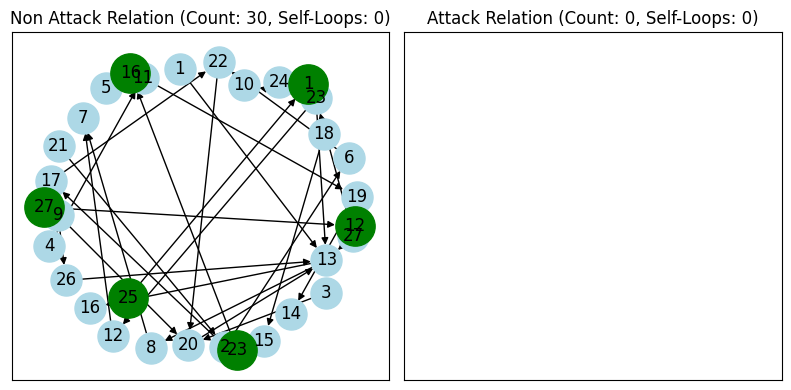

In [26]:

list_a, list_b, node_descriptions = convert_lists_to_integers(lgbtq_1, lgbtq_2)
visualize_graph(list_a, list_b, lgbtq_rel, node_descriptions, figsize=(30, 25), k=5)
visualize_graph(list_a, list_b, lgbtq_davin, node_descriptions, figsize=(30, 25), k=5)
visualize_graph(list_a, list_b, lgbtq_35, node_descriptions, figsize=(30, 25), k=5)
visualize_graph(list_a, list_b, lgbtq_0613, node_descriptions, figsize=(30, 25), k=5)

In [27]:

leader_1 = output_data['data_Leadership']['sentence_1']
leader_2 = output_data['data_Leadership']['sentence_2']
leader_rel = output_data['data_Leadership']['relation_BAF']
leader_davin = output_data['data_Leadership']['gpt_davinci']
leader_35 = output_data['data_Leadership']['gpt_35']
leader_0613 = output_data['data_Leadership']['gpt_35_0613']

Non Atk: 10 Atk: 0 Summ: 10


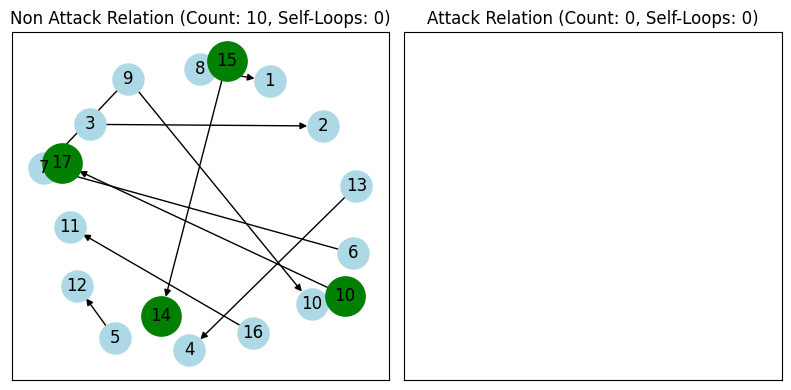

In [29]:
list_a, list_b, node_descriptions = convert_lists_to_integers(leader_1, leader_2)
visualize_graph(list_a, list_b, leader_rel, node_descriptions, figsize=(30, 25), k=5)

In [36]:
print(leader_1[0])
print(leader_2[0])
print(leader_rel[0])
print("------------")
print(list_a[0])
print(list_b[0])
print(node_descriptions[list_a[0]])
print(node_descriptions[list_b[0]])


And you know what?
He will kill it.
0
------------
6
7
And you know what?
He will kill it.


In [33]:
df[df['topic'] == 'Leadership']

,_unit_id,_golden,_unit_state,_trusted_judgments,confidence,confidence:stddev,relation,relation:confidence,orig__golden,context,...,sentence_1,sentence_2,speaker_1,speaker_2,topic,relation_AAF,relation_BAF,gpt_davinci,gpt_35,gpt_35_0613
73,3085730183,False,finalized,6,3.67,0.471,neither,0.8161,NaN,"<strong>Kristen Welker:</strong> ""You’ll each ...",...,And you know what?,He will kill it.,Donald Trump,Donald Trump,Leadership,0,0,1,1,1
605,3085730720,False,finalized,3,4.00,0.000,neither,1.0000,NaN,"<strong>Donald Trump:</strong> ""The other side...",...,"Your 401(k)s will go to hell, and it’ll be a v...","I represent all of you, whether you voted for ...",Donald Trump,Joe Biden,Leadership,0,0,2,0,0
612,3085730727,False,finalized,4,4.50,0.500,neither,0.7585,NaN,"<strong>Donald Trump:</strong> ""They wanted to...",...,They wanted to unify.,He will kill it.,Donald Trump,Donald Trump,Leadership,0,0,1,1,1
1181,3090747190,False,finalized,3,4.33,0.471,neither,1.0000,NaN,"<strong>Donald Trump:</strong> ""The other side...",...,"If he gets in, you will have a Depression, the...",I’m going to give you hope.,Donald Trump,Joe Biden,Leadership,0,0,2,0,2
2175,3095157351,False,finalized,3,3.33,0.471,neither,1.0000,NaN,"<strong>Kristen Welker:</strong> ""This is abou...",...,"But, I will tell you, go back.",We had the best Black unemployment numbers in ...,Donald Trump,Donald Trump,Leadership,0,0,0,0,0
2192,3095157368,False,finalized,4,4.25,0.433,neither,0.7687,NaN,"<strong>Donald Trump:</strong> ""Now we’re rebu...",...,They wanted to unify.,We are on the road to success.,Donald Trump,Donald Trump,Leadership,0,0,2,0,0
2450,3095157629,False,finalized,3,4.00,0.000,neither,1.0000,NaN,"<strong>Kristen Welker:</strong> ""What will yo...",...,We have to make our country totally successful...,They wanted to get together.,Donald Trump,Donald Trump,Leadership,0,0,0,0,0
3284,3101642914,False,finalized,7,3.71,0.700,support,0.5639,NaN,"<strong>Donald Trump:</strong> ""Hispanic, wome...",...,We are on the road to success.,"But I’m cutting taxes, and he wants to raise e...",Donald Trump,Donald Trump,Leadership,0,2,1,1,1
3297,3101642931,False,finalized,7,4.00,0.535,neither,0.5687,NaN,"<strong>Joe Biden:</strong> ""We can grow this ...",...,"Decency, honor, respect.","Treating people with dignity, making sure that...",Joe Biden,Joe Biden,Leadership,0,0,2,2,2
3473,3101643961,False,finalized,4,4.25,0.433,support,0.7485,NaN,"<strong>Joe Biden:</strong> ""I represent all o...",...,We’re going to choose to move forward because ...,"We can grow this economy, we can deal with the...",Joe Biden,Joe Biden,Leadership,0,2,2,2,2


In [43]:
print(list_a)
print(list_b)
print(node_descriptions)
print(node_descriptions["1"])

['14', '7', '11', '10', '16', '11', '17', '2', '12', '6']
['3', '9', '3', '5', '4', '2', '8', '1', '15', '13']
{'1': 'But I’m cutting taxes, and he wants to raise everybody’s taxes and he wants to put new regulations on everything.', '2': 'We are on the road to success.', '3': 'He will kill it.', '4': 'We had the best Black unemployment numbers in the history of our country.', '5': 'I’m going to give you hope.', '6': 'We’re going to choose to move forward because we have enormous opportunities, enormous opportunities to make things better.', '7': 'Your 401(k)s will go to hell, and it’ll be a very, very sad day for this country.', '8': 'They wanted to get together.', '9': 'I represent all of you, whether you voted for me or against me, and I’m going to make sure that you’re represented.', '10': 'If he gets in, you will have a Depression, the likes of which you’ve never seen.', '11': 'They wanted to unify.', '12': 'Decency, honor, respect.', '13': 'We can grow this economy, we can deal w

Non Atk: 7 Atk: 3 Summ: 10


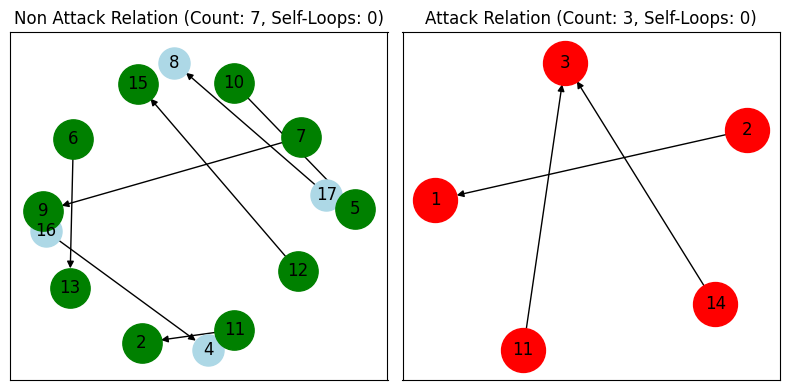

In [44]:

visualize_graph(list_a, list_b, leader_davin, node_descriptions, figsize=(30, 25), k=5)

Non Atk: 7 Atk: 3 Summ: 10


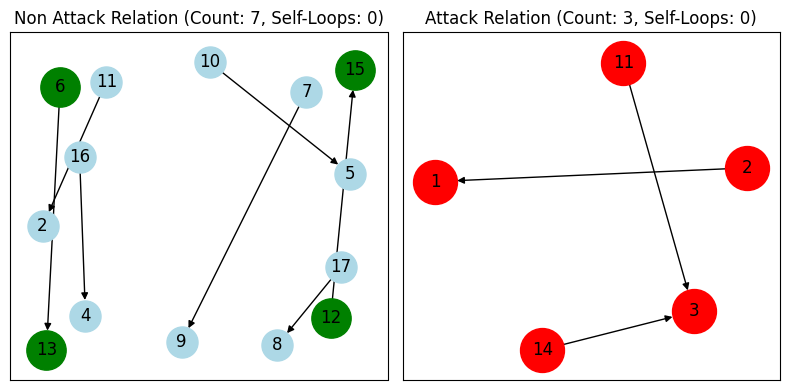

In [45]:

visualize_graph(list_a, list_b, leader_35, node_descriptions, figsize=(30, 25), k=5)

In [46]:
print("3:", node_descriptions['3'])
print("12:", node_descriptions['12'])
print("15:", node_descriptions['15'])

3: He will kill it.
12: Decency, honor, respect.
15: Treating people with dignity, making sure that everyone has an even chance.


In [47]:
print("2:", node_descriptions['2'])
print("8:", node_descriptions['8'])

print("2:", node_descriptions['10'])
print("8:", node_descriptions['9'])

2: We are on the road to success.
8: They wanted to get together.
2: If he gets in, you will have a Depression, the likes of which you’ve never seen.
8: I represent all of you, whether you voted for me or against me, and I’m going to make sure that you’re represented.


Non Atk: 7 Atk: 3 Summ: 10


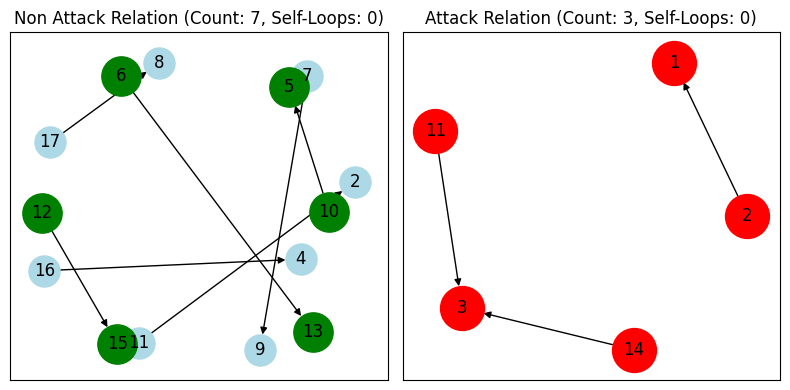

In [48]:
visualize_graph(list_a, list_b, leader_0613, node_descriptions, figsize=(30, 25), k=5)

In [49]:
print(node_descriptions)

{'1': 'But I’m cutting taxes, and he wants to raise everybody’s taxes and he wants to put new regulations on everything.', '2': 'We are on the road to success.', '3': 'He will kill it.', '4': 'We had the best Black unemployment numbers in the history of our country.', '5': 'I’m going to give you hope.', '6': 'We’re going to choose to move forward because we have enormous opportunities, enormous opportunities to make things better.', '7': 'Your 401(k)s will go to hell, and it’ll be a very, very sad day for this country.', '8': 'They wanted to get together.', '9': 'I represent all of you, whether you voted for me or against me, and I’m going to make sure that you’re represented.', '10': 'If he gets in, you will have a Depression, the likes of which you’ve never seen.', '11': 'They wanted to unify.', '12': 'Decency, honor, respect.', '13': 'We can grow this economy, we can deal with the systemic racism.', '14': 'And you know what?', '15': 'Treating people with dignity, making sure that ev